In [2]:
import pandas as pd
from ydata_profiling import ProfileReport

Pandas backend NOT loaded
Numpy backend NOT loaded
Pyspark backend NOT loaded
Python backend loaded


In [3]:
df_listing_sep = pd.read_csv('listings_sept.csv')
df_listing_jun = pd.read_csv('listings_jun.csv')
# df_listing_mar = pd.read_csv('listings_sum_march.csv')

df_rev_sep = pd.read_csv('reviews_sept.csv')
df_rev_jun = pd.read_csv('reviews_jun.csv')
# df_rev_mar = pd.read_csv('reviews_march.csv')

In [4]:
df_rev_jun.head()

,listing_id,date
0,3109,2017-10-28
1,3109,2017-11-03
2,3109,2018-07-24
3,3109,2019-10-24
4,5396,2009-06-30


In [39]:
# df_listing_mar[df_listing_mar.last_review >= '2024-03-22']
df_listing_mar[df_listing_mar.id == 649113463883104438]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
42877,649113463883104438,Best view of Paris from a cosy appartement,368501975,Sixtine,NaN,Ménilmontant,48.86697,2.39228,Entire home/apt,126.0,2,36,2024-02-19,1.73,1,9,17,7512006745785


In [10]:
pd.to_datetime(df_listing_sep.last_review).min()

Timestamp('2010-05-28 00:00:00')

In [37]:
df_listing_jun[df_listing_jun.last_review >= '2024-04-01']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
4,1097932353733680407,Beau studio au cœur de Barbès,514983472,Rebaia,NaN,Buttes-Montmartre,48.886598,2.359753,Entire home/apt,NaN,1,2,2024-04-07,0.59,1,0,2,7511808567461
19,1143374758553613989,Appartement Parisien au coeur du 18ème,25220000,Simon,NaN,Buttes-Montmartre,48.891924,2.346870,Entire home/apt,170.0,3,1,2024-06-07,1.00,1,35,1,7511812859415
20,752590421915936661,Appartement 2 pièces Paris 9 EME,162122413,Louis,NaN,Opéra,48.880810,2.334850,Entire home/apt,77.0,4,4,2024-06-08,1.62,9,237,4,Exempt - hotel-type listing
30,649113463883104438,Best view of Paris from a cosy appartement,368501975,Sixtine,NaN,Ménilmontant,48.866970,2.392280,Entire home/apt,NaN,2,43,2024-05-26,1.82,1,0,17,7512006745785
54,1120716951395612188,Appartement studette de 9m2,366144411,Mickael,NaN,Popincourt,48.857479,2.384641,Entire home/apt,40.0,2,7,2024-06-08,3.89,1,224,7,Exempt - hotel-type listing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95869,871784833297770621,Charmant appartement à Paris,70623915,François,NaN,Opéra,48.879003,2.335977,Entire home/apt,169.0,2,28,2024-05-22,2.13,1,336,24,7510908323230
95875,907946356797419790,Chambre d’hôtes au cœur du 13eme à une rue du ...,140620571,Christian,NaN,Gobelins,48.836197,2.353399,Private room,86.0,1,32,2024-05-31,2.64,2,15,32,7511312745726
95876,916576207806797596,Cocon parisien,124238791,Marie-Alix,NaN,Passy,48.846217,2.269740,Entire home/apt,175.0,3,7,2024-06-03,0.80,1,216,7,7511608725784
95878,2298063,Heart of Paris Notre Dame - Studio,9369079,Bastien,NaN,Panthéon,48.851020,2.345050,Entire home/apt,250.0,4,150,2024-05-25,1.19,1,51,20,7510502458503


In [4]:
df_rev_sep['real_date'] =  pd.to_datetime(df_rev_sep['date'])

df_rev_sep[['real_date', 'listing_id']].groupby('listing_id').aggregate(['min', 'max'])

real_date           
                           min        max
listing_id                               
3109                2017-10-28 2019-10-24
5396                2009-06-30 2024-09-01
7397                2011-04-08 2024-08-27
7964                2010-05-10 2015-09-14
9952                2013-03-19 2024-05-23
...                        ...        ...
1237042259061485682 2024-09-08 2024-09-10
1237081091596854348 2024-09-08 2024-09-08
1237662352760899905 2024-09-08 2024-09-08
1238201820642240481 2024-09-09 2024-09-09
1238568635341928457 2024-09-08 2024-09-08

[68319 rows x 2 columns]

1 . reviews contains all review since host join airbnb until finish date (based on data is taken)

In [5]:
#  compare dataset
jun_cols = ['id', 'room_type','price', 'number_of_reviews', 'last_review','neighbourhood', 
            'minimum_nights', 'calculated_host_listings_count', 'availability_365', 'license']

df_combine = df_listing_jun[jun_cols].merge(df_listing_sep[['id', 'price', 'number_of_reviews', 'last_review','minimum_nights', 'availability_365']], 
                                                           how='inner', on='id',
                                                           suffixes = ("_jun","_sep"))

In [6]:
import numpy as np

df_combine['diff_price'] = df_combine['price_sep'] - df_combine['price_jun']
df_combine['diff_review'] = df_combine['number_of_reviews_sep'] - df_combine['number_of_reviews_jun']
df_combine['diff_minimum_nights'] = df_combine['minimum_nights_sep'] - df_combine['minimum_nights_jun']
df_combine['price_ratio'] = np.round(df_combine['price_sep'] / df_combine['price_jun'],2)
df_combine['diff_availability'] = df_combine['availability_365_sep'] - df_combine['availability_365_jun']
df_combine['price_ratio'] = np.round(df_combine['price_sep'] / df_combine['price_jun'], 2)
df_combine['have_license'] = df_combine['license'].isna()

In [5]:
df_combine.sort_values(by='diff_price', ascending=False).to_csv('combine_dataset.csv', index=False)

In [ ]:
# profile_listing = ProfileReport(df_combine)
# profile_listing

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.75s/it]


In [6]:
df_combine[['neighbourhood', 'room_type', 'diff_price']].groupby(['neighbourhood','room_type']).aggregate(['median', 'mean']).reset_index()

neighbourhood        room_type diff_price           
                                             median       mean
0   Batignolles-Monceau  Entire home/apt        0.0 -14.600838
1   Batignolles-Monceau       Hotel room       15.5  29.450000
2   Batignolles-Monceau     Private room        0.0   0.017391
3   Batignolles-Monceau      Shared room        0.0   0.000000
4                Bourse  Entire home/apt       -1.0 -26.207847
..                  ...              ...        ...        ...
75            Vaugirard      Shared room       -1.0 -11.000000
76               Élysée  Entire home/apt        0.0 -44.073099
77               Élysée       Hotel room        0.0 -37.636364
78               Élysée     Private room        0.0 -16.005525
79               Élysée      Shared room        NaN        NaN

[80 rows x 4 columns]

In [7]:
df_combine[df_combine.price_jun.notna()][['neighbourhood', 'room_type', 'price_ratio']].groupby(['neighbourhood','room_type']).quantile(0.9).reset_index().sort_values(by='price_ratio')

,neighbourhood,room_type,price_ratio
35,Luxembourg,Shared room,0.978
9,Buttes-Chaumont,Hotel room,0.999
31,Louvre,Shared room,1.000
3,Batignolles-Monceau,Shared room,1.000
51,Palais-Bourbon,Shared room,1.000
...,...,...,...
17,Entrepôt,Hotel room,1.372
66,Reuilly,Private room,1.422
1,Batignolles-Monceau,Hotel room,1.512
39,Ménilmontant,Shared room,1.820


In [38]:
df_combine[(df_combine.neighbourhood == 'Reuilly') & (df_combine.price_jun.notna())]

,id,room_type,price_jun,number_of_reviews_jun,last_review_jun,neighbourhood,minimum_nights_jun,calculated_host_listings_count,availability_365_jun,license,price_sep,number_of_reviews_sep,last_review_sep,minimum_nights_sep,availability_365_sep,diff_price,diff_review,diff_minimum_nights,price_ratio,diff_availability
142,922552176843762358,Entire home/apt,631.0,13,2023-11-27,Reuilly,2,9,54,7511208817253,130.0,13,2023-11-27,2,94,-501.0,0,0,0.21,40
170,1057708617405843330,Entire home/apt,389.0,12,2024-05-31,Reuilly,1,35,292,7511210991439,254.0,18,2024-08-28,1,307,-135.0,6,0,0.65,15
188,983071403442461271,Entire home/apt,1400.0,0,NaN,Reuilly,4,1,239,7511209711435,1400.0,0,NaN,4,269,0.0,0,0,1.00,30
217,15387349,Entire home/apt,108.0,109,2024-05-10,Reuilly,2,1,267,7511206253087,115.0,111,2024-08-13,2,212,7.0,2,0,1.06,-55
237,1054136256647665344,Entire home/apt,326.0,0,NaN,Reuilly,1,1,190,7501213911391,326.0,0,NaN,1,219,0.0,0,0,1.00,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85559,1157988959941868122,Entire home/apt,159.0,0,NaN,Reuilly,4,3,258,7511210049540,279.0,0,NaN,4,255,120.0,0,0,1.75,-3
85561,787627131600137462,Entire home/apt,500.0,0,NaN,Reuilly,1,1,210,NaN,500.0,0,NaN,1,269,0.0,0,0,1.00,59
85564,1071540712909405855,Entire home/apt,500.0,0,NaN,Reuilly,7,1,157,NaN,500.0,0,NaN,7,219,0.0,0,0,1.00,62
85568,48882087,Entire home/apt,61.0,0,NaN,Reuilly,5,1,70,7511209584048,60.0,0,NaN,5,99,-1.0,0,0,0.98,29


In [10]:
df_combine.describe()

,id,price_jun,number_of_reviews_jun,minimum_nights_jun,calculated_host_listings_count,availability_365_jun,price_sep,number_of_reviews_sep,minimum_nights_sep,availability_365_sep,diff_price,diff_review,diff_minimum_nights,price_ratio,diff_availability
count,8.557900e+04,65202.000000,85579.000000,85579.000000,85579.000000,85579.000000,55593.000000,85579.000000,85579.000000,85579.000000,54106.000000,85579.000000,85579.000000,54106.000000,85579.000000
mean,5.511349e+17,281.658799,21.124657,44.075755,22.272695,126.741502,262.144047,22.877961,44.078594,122.477792,-16.701900,1.753304,0.002839,1.015097,-4.263710
std,4.923977e+17,685.817324,53.987863,111.225349,87.135705,120.973254,513.938287,55.646565,111.194340,129.647158,484.509894,3.515197,10.529194,0.816208,64.225262
min,3.109000e+03,10.000000,0.000000,1.000000,1.000000,0.000000,8.000000,0.000000,1.000000,0.000000,-71744.000000,-2.000000,-399.000000,0.000000,-365.000000
25%,2.883163e+07,110.000000,0.000000,2.000000,1.000000,14.000000,106.000000,0.000000,2.000000,0.000000,-13.000000,0.000000,0.000000,0.910000,-23.000000
50%,7.136246e+17,163.000000,4.000000,3.000000,1.000000,87.000000,160.000000,5.000000,3.000000,76.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,1.037149e+18,280.000000,19.000000,5.000000,2.000000,234.000000,270.000000,22.000000,5.000000,249.000000,3.000000,2.000000,0.000000,1.030000,19.000000
max,1.176033e+18,72000.000000,3067.000000,1000.000000,730.000000,365.000000,30400.000000,3295.000000,1000.000000,365.000000,29810.000000,228.000000,364.000000,97.830000,365.000000


In [43]:
df_combine[df_combine.price_ratio > 2][['neighbourhood', 'price_ratio']].groupby('neighbourhood').median().sort_values(by='price_ratio')

,price_ratio
neighbourhood,
Buttes-Montmartre,2.410
Ménilmontant,2.440
Observatoire,2.440
Hôtel-de-Ville,2.470
Élysée,2.490
Palais-Bourbon,2.500
Gobelins,2.530
Buttes-Chaumont,2.550
Passy,2.550


(array([1.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00,
        3.0000e+00, 2.7900e+02, 5.3814e+04, 6.0000e+00, 1.0000e+00]),
 array([-71744. , -61588.6, -51433.2, -41277.8, -31122.4, -20967. ,
        -10811.6,   -656.2,   9499.2,  19654.6,  29810. ]),
 <BarContainer object of 10 artists>)

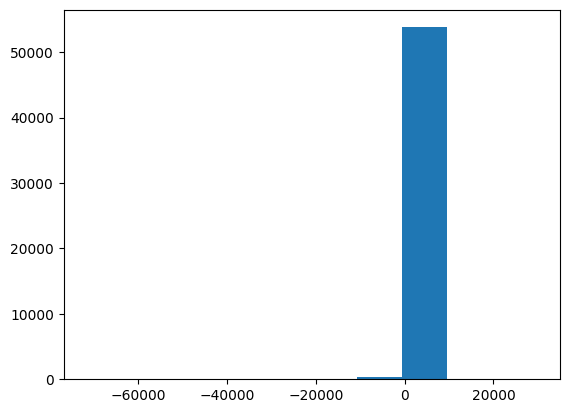

In [11]:
import matplotlib.pyplot as plt 

plt.hist(df_combine.diff_price)

In [7]:
df_combine[['neighbourhood', 'price_ratio', 'id']].groupby('neighbourhood').aggregate({
                                                                                'price_ratio': [lambda x: x.quantile(0.25), 'median', 'mean',lambda x: x.quantile(0.75) ],
                                                                                'id': ['nunique']
                                                                            }).reset_index().head(20)

neighbourhood price_ratio                                  id
                         <lambda_0> median      mean <lambda_1> nunique
0   Batignolles-Monceau       0.950    1.0  1.014865       1.03    5988
1                Bourse       0.840    1.0  0.967946       1.03    2779
2       Buttes-Chaumont       0.960    1.0  1.022123       1.02    4897
3     Buttes-Montmartre       0.940    1.0  1.005355       1.02    9543
4              Entrepôt       0.910    1.0  1.037776       1.02    5871
5              Gobelins       0.930    1.0  1.017830       1.01    2902
6        Hôtel-de-Ville       0.900    1.0  0.987479       1.03    2550
7                Louvre       0.850    1.0  1.003250       1.04    1837
8            Luxembourg       0.910    1.0  1.008702       1.04    2441
9          Ménilmontant       0.960    1.0  1.021888       1.00    4739
10         Observatoire       0.930    1.0  1.012072       1.02    3207
11                Opéra       0.920    1.0  1.051739       1.05    4156
12       Palais-Bourbon       0.890    1.0  1.016291       1.05    2421
13             Panthéon       0.880    1.0  1.000757       1.03    2684
14                Passy       0.915    1.0  1.013278       1.03    5479
15           Popincourt       0.930    1.0  1.028582       1.02    7612
16              Reuilly       0.920    1.0  1.071688       1.01    3535
17               Temple       0.870    1.0  0.973359       1.01    3507
18            Vaugirard       0.920    1.0  1.017227       1.03    6841
19               Élysée       0.870    1.0  0.990671       1.04    2590

import seaborn as sns
import matplotlib.pyplot as plt
# Create a boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x='room_type', y='price', data=df_listing, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price")
plt.title("Boxplot of Values by Group")
plt.show()

## clustering

In [8]:
df_combine.columns

Index(['id', 'room_type', 'price_jun', 'number_of_reviews_jun',
       'last_review_jun', 'neighbourhood', 'minimum_nights_jun',
       'calculated_host_listings_count', 'availability_365_jun', 'license',
       'price_sep', 'number_of_reviews_sep', 'last_review_sep',
       'minimum_nights_sep', 'availability_365_sep', 'diff_price',
       'diff_review', 'diff_minimum_nights', 'price_ratio',
       'diff_availability', 'have_license'],
      dtype='object')

In [9]:
# df_listings_filt_enc = pd.get_dummies(df_listings_filt, columns=['neighbourhood', 'room_type'], drop_first=True)

from sklearn.preprocessing import OneHotEncoder

encoder_neig = OneHotEncoder(sparse=False, drop='first')
encoded_neig = encoder_neig.fit_transform(df_combine[['neighbourhood']])
df_neig_encoded = pd.DataFrame(encoded_neig, columns=encoder_neig.get_feature_names_out(['neighbourhood']))

encoder_room = OneHotEncoder(sparse=False, drop='first')
encoded_room = encoder_room.fit_transform(df_combine[['room_type']])
df_room_encoded = pd.DataFrame(encoded_room, columns=encoder_room.get_feature_names_out(['room_type']))

In [10]:
# cluster_cols = []

# df_listings_filt.join(encoded)
df_cluster = pd.concat([df_combine.drop(columns=['neighbourhood']), df_neig_encoded], axis=1)
df_cluster = pd.concat([df_cluster.drop(columns=['room_type']), df_room_encoded], axis=1)
df_cluster = df_cluster.drop(columns=['id', 'license', 'last_review_jun', 'last_review_sep'])

In [11]:
df_cluster_filt = df_cluster[(df_cluster.price_jun.notna()) & (df_cluster.price_sep.notna())].copy()

In [12]:
df_cluster_filt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54106 entries, 12 to 85578
Data columns (total 37 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   price_jun                        54106 non-null  float64
 1   number_of_reviews_jun            54106 non-null  int64  
 2   minimum_nights_jun               54106 non-null  int64  
 3   calculated_host_listings_count   54106 non-null  int64  
 4   availability_365_jun             54106 non-null  int64  
 5   price_sep                        54106 non-null  float64
 6   number_of_reviews_sep            54106 non-null  int64  
 7   minimum_nights_sep               54106 non-null  int64  
 8   availability_365_sep             54106 non-null  int64  
 9   diff_price                       54106 non-null  float64
 10  diff_review                      54106 non-null  int64  
 11  diff_minimum_nights              54106 non-null  int64  
 12  price_ratio           

In [13]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = []
# silhouette_scores = []

for k in range(1, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_cluster_filt)
    inertia.append(kmeans.inertia_)

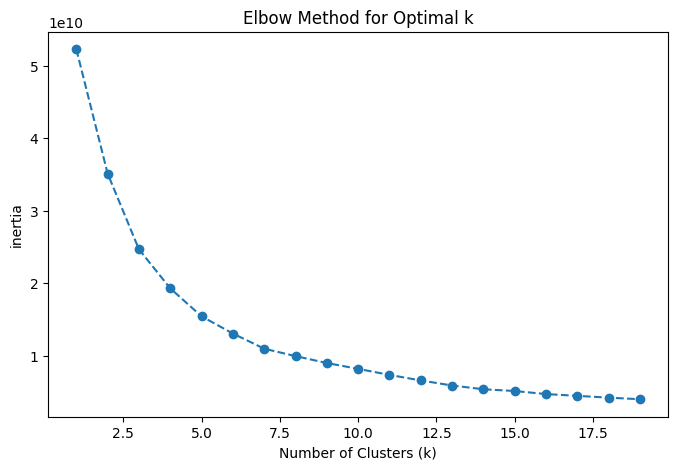

In [14]:
plt.figure(figsize=(8,5))
plt.plot(range(1, 20), inertia, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

In [23]:
kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
kmeans.fit(df_cluster_filt)

df_combine_filt = df_combine[(df_combine.price_jun.notna()) & (df_combine.price_sep.notna())].copy()
df_combine_filt['cluster_group'] = kmeans.predict(df_cluster_filt)

In [24]:

df_combine_filt[['price_ratio','cluster_group']].groupby('cluster_group').aggregate([lambda x: x.quantile(0.25), 'median', lambda x: x.quantile(0.75)])

price_ratio                  
               <lambda_0> median <lambda_1>
cluster_group                              
0                    0.91    1.0       1.03
1                    0.31    1.0       1.00

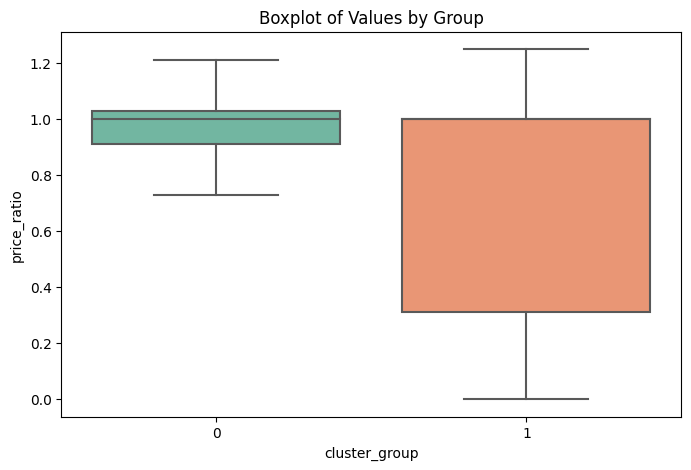

In [25]:
# Create a boxplot
import seaborn as sb

plt.figure(figsize=(8, 5))
sb.boxplot(x='cluster_group', y='price_ratio', data=df_combine_filt, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price_ratio")
plt.title("Boxplot of Values by Group")
plt.show()

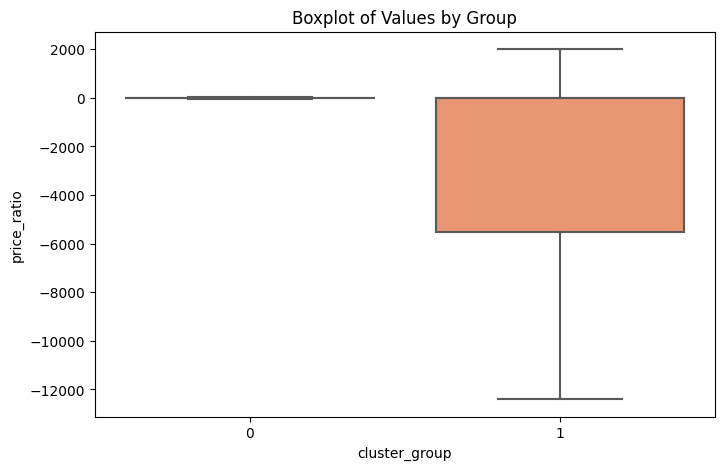

In [26]:
# Create a boxplot
import seaborn as sb

plt.figure(figsize=(8, 5))
sb.boxplot(x='cluster_group', y='diff_price', data=df_combine_filt, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price_ratio")
plt.title("Boxplot of Values by Group")
plt.show()

In [22]:
df_combine_filt[['cluster_group', 'price_ratio']].groupby('cluster_group').quantile(.95)

,price_ratio
cluster_group,
0,1.380
1,0.000
2,1.944
